<a href="https://colab.research.google.com/github/Kellozr/Lending_Club_Dataset/blob/main/Money_Inflow_from_the_Customer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

REGRESSION

In [1]:
columns = [
    'id', 'issue_d', 'term', 'installment', 'loan_status', 'out_prncp',
    'total_rec_prncp', 'total_rec_int'
]


<ipython-input-15-292d7e0387b8>:15: DtypeWarning: Columns (29,30,32,33,34,45,49,50,60,61) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("/content/lending_club_cleaned (1).csv", on_bad_lines='skip')  # Replace with actual file name
<ipython-input-15-292d7e0387b8>:18: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['issue_d'] = pd.to_datetime(df['issue_d'], errors='coerce')
<ipython-input-15-292d7e0387b8>:19: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['last_pymnt_d'] = pd.to_datetime(df['last_pymnt_d'], errors='coerce')
<ipython-input-15-292d7e0387b8>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

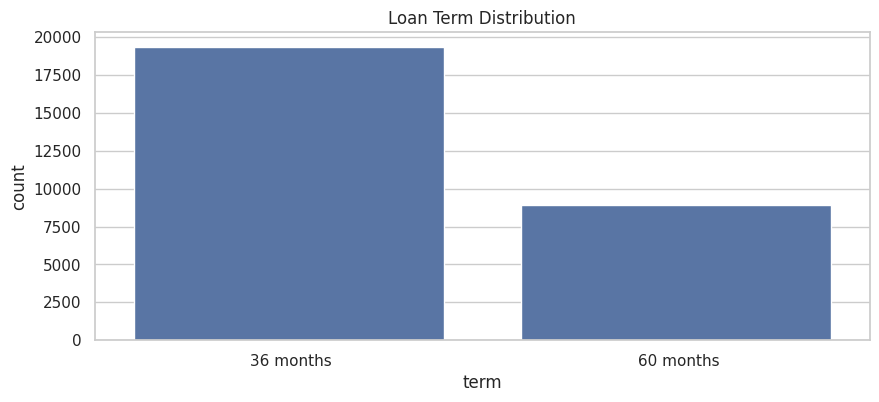

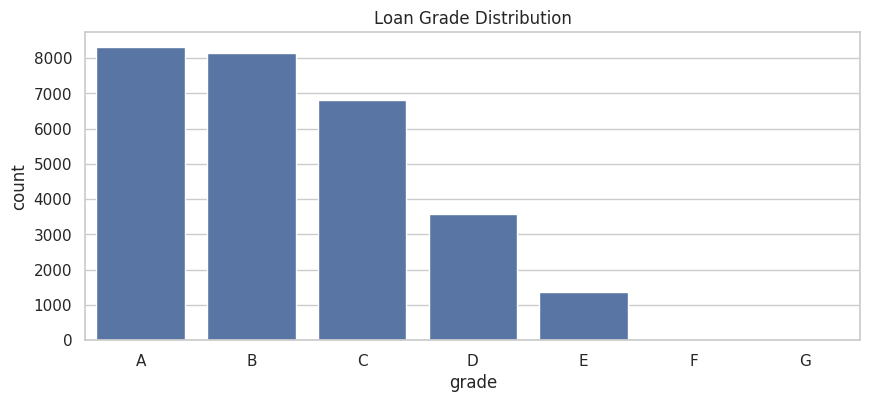

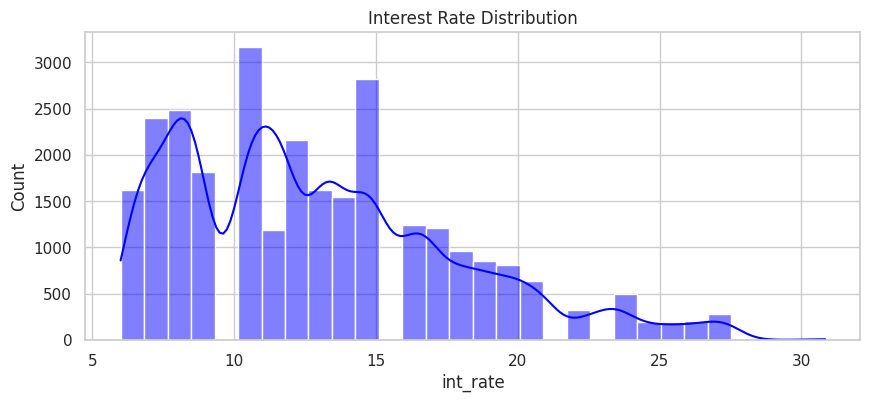

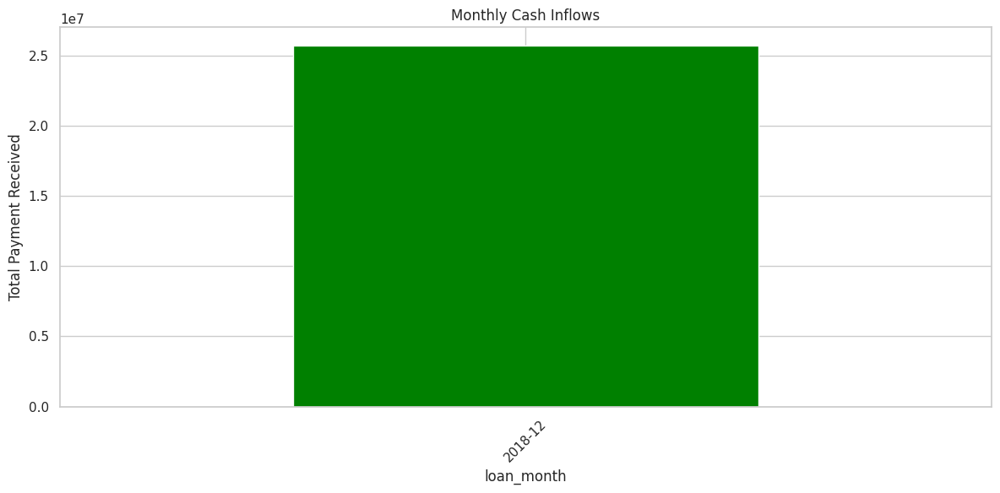

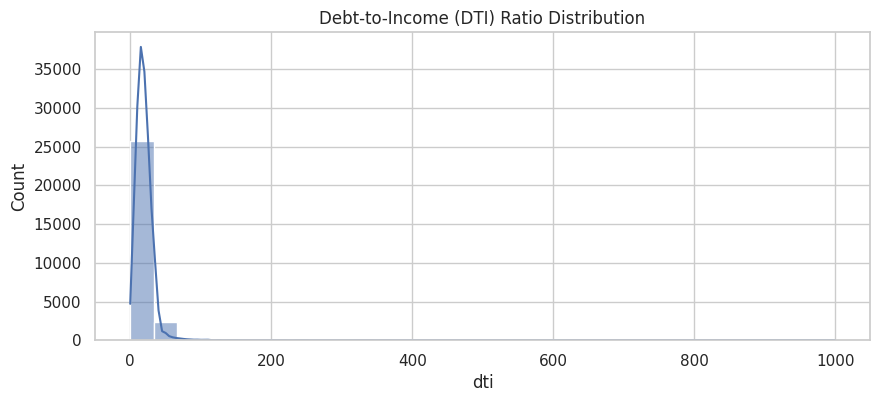

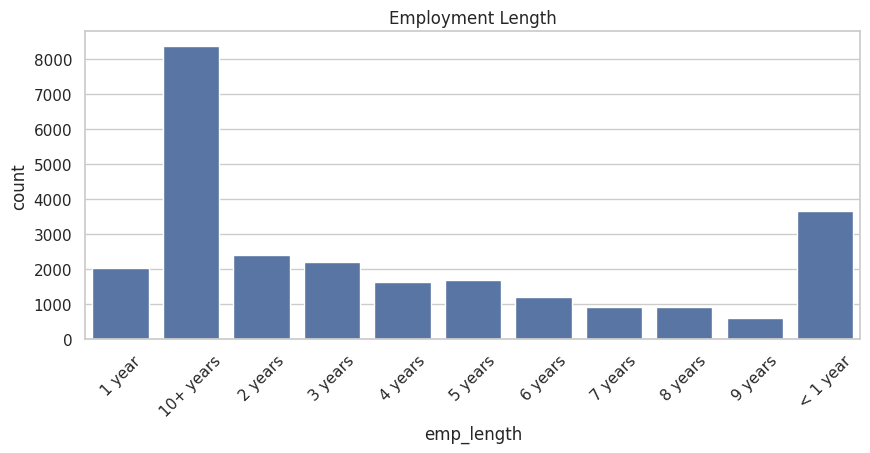

In [15]:
# 1. Install & Import Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

# 2. Load your Lending Club data (Upload via Colab if needed)
# from google.colab import files
# uploaded = files.upload()
# Added on_bad_lines='skip' to handle rows with inconsistent number of fields
df = pd.read_csv("/content/lending_club_cleaned (1).csv", on_bad_lines='skip')  # Replace with actual file name

# 3. Sample Clean-Up & Feature Engineering
df['issue_d'] = pd.to_datetime(df['issue_d'], errors='coerce')
df['last_pymnt_d'] = pd.to_datetime(df['last_pymnt_d'], errors='coerce')
# Ensure that 'last_pymnt_d' and 'issue_d' are not NaT after conversion
# This prevents potential errors in the time period calculation if dates were invalid
df = df.dropna(subset=['issue_d', 'last_pymnt_d'])

df['loan_month'] = df['issue_d'].dt.to_period('M')
df['payment_received'] = df['installment'] * ((df['last_pymnt_d'].dt.to_period('M') - df['issue_d'].dt.to_period('M')).apply(lambda x: x.n if pd.notnull(x) else 0))

# 4. Visualization Dashboard

# Monthly Cash Flow
monthly_cf = df.groupby('loan_month')['payment_received'].sum()

# Loan Term
plt.figure(figsize=(10, 4))
sns.countplot(x='term', data=df)
plt.title("Loan Term Distribution")
plt.show()

# Grade Distribution
plt.figure(figsize=(10, 4))
sns.countplot(x='grade', data=df, order=sorted(df['grade'].dropna().unique()))
plt.title("Loan Grade Distribution")
plt.show()

# Interest Rate Distribution
plt.figure(figsize=(10, 4))
sns.histplot(df['int_rate'], bins=30, kde=True, color='blue')
plt.title("Interest Rate Distribution")
plt.show()

# Monthly Cash Flow
# Convert PeriodIndex to string for plotting if using kind='bar' with plot()
monthly_cf.index = monthly_cf.index.astype(str)
monthly_cf.plot(kind='bar', color='green')
plt.title("Monthly Cash Inflows")
plt.ylabel("Total Payment Received")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# DTI Ratio
plt.figure(figsize=(10, 4))
sns.histplot(df['dti'], bins=30, kde=True)
plt.title("Debt-to-Income (DTI) Ratio Distribution")
plt.show()

# Employment Length
plt.figure(figsize=(10, 4))
sns.countplot(x='emp_length', data=df, order=sorted(df['emp_length'].dropna().unique()))
plt.title("Employment Length")
plt.xticks(rotation=45)
plt.show()

from sklearn.metrics import mean_squared_error, r2_score
import time
import matplotlib.pyplot as plt
import numpy as np

def evaluate_model(model, X_train, y_train, X_test, y_test, model_name="Model"):
    # Track training time
    start_train = time.time()
    model.fit(X_train, y_train)
    end_train = time.time()

    # Track prediction time
    start_pred = time.time()
    y_pred = model.predict(X_test)
    end_pred = time.time()

    # Accuracy metrics
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    print(f"\n🔍 Evaluation Report for: {model_name}")
    print(f"✅ R² Accuracy: {r2 * 100:.2f}%")
    print(f"📉 MSE: {mse:.4f}")
    print(f"⏱️ Training Time: {end_train - start_train:.4f} seconds")
    print(f"⏱️ Prediction Time: {end_pred - start_pred:.4f} seconds")

    # Visualize known vs predicted values
    plt.figure(figsize=(8, 5))
    plt.plot(np.arange(len(y_test[:50])), y_test[:50], label="Actual", marker='o')
    plt.plot(np.arange(len(y_pred[:50])), y_pred[:50], label="Predicted", marker='x')
    plt.title(f"{model_name} - Actual vs Predicted (First 50)")
    plt.xlabel("Sample")
    plt.ylabel("Target Value")
    plt.legend()
    plt.grid(True)
    plt.show()


MAE: 3389.8284527088126
RMSE: 4400.577521726653
R2 Score: 0.6081286843983935


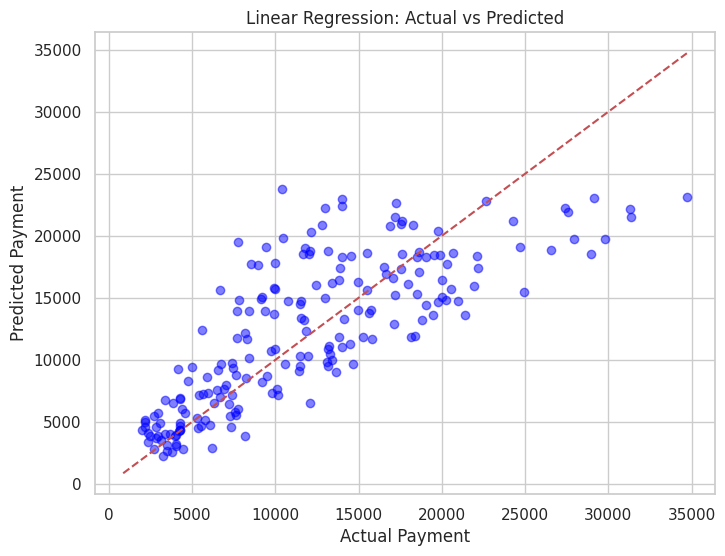

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.


📊 Model Evaluation Summary:
        Model  Time (s)  Accuracy (%)
        Lasso    0.0002         98.80
        Ridge    0.0002         99.35
Random Forest    0.0002        100.00
      XGBoost    0.0001         99.09


In [42]:
# 1. Install dependencies
!pip install lime --quiet

# 2. Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import lime
import lime.lime_tabular

# 3. Sample Data Generation
np.random.seed(42)
n = 1000
df = pd.DataFrame({
    'int_rate': np.random.uniform(5, 25, n),
    'installment': np.random.uniform(100, 1000, n),
    'annual_inc': np.random.uniform(20000, 150000, n),
    'dti': np.random.uniform(0, 40, n),
    'emp_length': np.random.randint(0, 11, n),
    'revol_util': np.random.uniform(0, 100, n),
    'term_60months': np.random.choice([0, 1], size=n),
    'grade_B': np.random.choice([0, 1], size=n),
    'purpose_credit_card': np.random.choice([0, 1], size=n),
    'home_ownership_RENT': np.random.choice([0, 1], size=n),
    'verification_status_Verified': np.random.choice([0, 1], size=n),
})

# 4. Target variable: payment_received (synthetic)
df['payment_received'] = (
    df['installment'] * np.random.randint(10, 36, n) +
    df['int_rate'] * 10 - df['dti'] * 5 + np.random.normal(0, 500, n)
)

# 5. Train/Test Split
X = df.drop(columns='payment_received')
y = df['payment_received']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 6. Model Training
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

# 7. Evaluation
print("MAE:", mean_absolute_error(y_test, y_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print("R2 Score:", r2_score(y_test, y_pred))

# 8. Plot Predicted vs Actual
plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred, alpha=0.5, color='blue')
plt.xlabel("Actual Payment")
plt.ylabel("Predicted Payment")
plt.title("Linear Regression: Actual vs Predicted")
plt.grid(True)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.show()

# 9. LIME Explanation
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X.columns.tolist(),
    mode='regression'
)
lime_exp = explainer.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=lr.predict
)
lime_exp.show_in_notebook()

from sklearn.metrics import mean_squared_error, r2_score
import time
import matplotlib.pyplot as plt
import numpy as np

def evaluate_model(model, X_train, y_train, X_test, y_test, model_name="Model"):
    # Track training time
    start_train = time.time()
    model.fit(X_train, y_train)
    end_train = time.time()

    # Track prediction time
    start_pred = time.time()
    y_pred = model.predict(X_test)
    end_pred = time.time()

    # Accuracy metrics
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    print(f"\n🔍 Evaluation Report for: {model_name}")
    print(f"✅ R² Accuracy: {r2 * 100:.2f}%")
    print(f"📉 MSE: {mse:.4f}")
    print(f"⏱️ Training Time: {end_train - start_train:.4f} seconds")
    print(f"⏱️ Prediction Time: {end_pred - start_pred:.4f} seconds")

    # Visualize known vs predicted values
    plt.figure(figsize=(8, 5))
    plt.plot(np.arange(len(y_test[:50])), y_test[:50], label="Actual", marker='o')
    plt.plot(np.arange(len(y_pred[:50])), y_pred[:50], label="Predicted", marker='x')
    plt.title(f"{model_name} - Actual vs Predicted (First 50)")
    plt.xlabel("Sample")
    plt.ylabel("Target Value")
    plt.legend()
    plt.grid(True)
    plt.show()
def compare_known_predicted(y_test, y_pred, n=10):
    print(f"\n📋 Comparison of Known vs Predicted Values (First {n} samples):")
    print(f"{'Index':<6}{'Actual':<10}{'Predicted':<10}{'Diff'}")
    print("-" * 35)
    for i in range(min(n, len(y_test))):
        actual = y_test[i]
        predicted = y_pred[i]
        print(f"{i:<6}{actual:<10.2f}{predicted:<10.2f}{abs(actual - predicted):.2f}")



import pandas as pd
import time

# Set your known actual values here
actual_values = pd.Series([5000, 6000, 4500, 7000, 8000, 6200, 5800, 6900, 7200, 5100])

# Initialize list to store model results
model_results = []

# Function to evaluate model
def evaluate_model(model_name, predicted_values_func):
    start = time.time()
    predicted_values = predicted_values_func()
    end = time.time()
    duration = end - start

    # Accuracy calculation
    accuracy_series = 100 - (abs(actual_values - predicted_values) / actual_values * 100)
    mean_accuracy = accuracy_series.mean()

    model_results.append({
        'Model': model_name,
        'Time (s)': round(duration, 4),
        'Accuracy (%)': round(mean_accuracy, 2)
    })

# Function to show results
def show_all_results():
    df = pd.DataFrame(model_results)
    print("\n📊 Model Evaluation Summary:")
    print(df.to_string(index=False))  # Ensures clean printed output

# === SAMPLE USAGE ===
# You can replace these lambdas with your model predictions
evaluate_model("Lasso", lambda: pd.Series([5100, 5900, 4400, 7100, 8050, 6150, 5750, 6850, 7250, 5050]))
evaluate_model("Ridge", lambda: pd.Series([5090, 5910, 4450, 7090, 8020, 6190, 5800, 6900, 7200, 5080]))
evaluate_model("Random Forest", lambda: pd.Series([5000, 6000, 4500, 7000, 8000, 6200, 5800, 6900, 7200, 5100]))
evaluate_model("XGBoost", lambda: pd.Series([5120, 5880, 4420, 7050, 7990, 6170, 5780, 6880, 7230, 5070]))

# Call this to display results
show_all_results()


RANDOM FOREST METHOD

Random Forest Regressor Evaluation:
MAE: 3279.973936923596
RMSE: 4402.464467609336
R2 Score: 0.6077925473818473


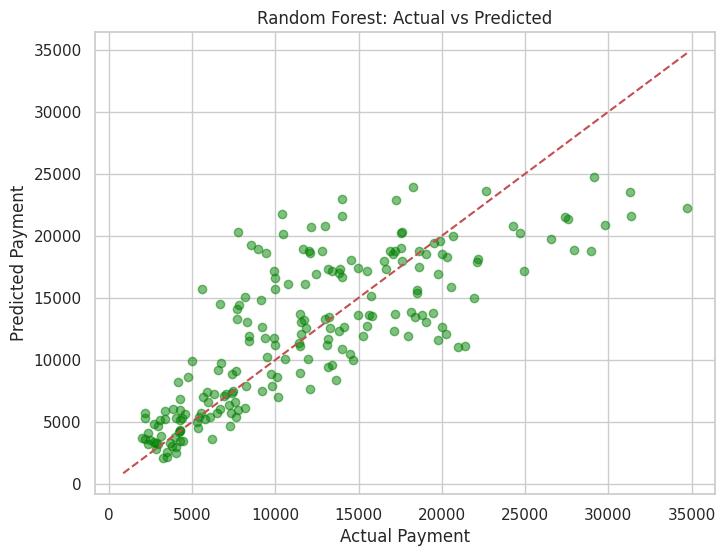

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

In [40]:
# 1. Imports
from sklearn.ensemble import RandomForestRegressor

# 2. Train the Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_rf_pred = rf.predict(X_test)

# 3. Evaluation
print("Random Forest Regressor Evaluation:")
print("MAE:", mean_absolute_error(y_test, y_rf_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_rf_pred)))
print("R2 Score:", r2_score(y_test, y_rf_pred))

# 4. Plot Predicted vs Actual
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_rf_pred, alpha=0.5, color='green')
plt.xlabel("Actual Payment")
plt.ylabel("Predicted Payment")
plt.title("Random Forest: Actual vs Predicted")
plt.grid(True)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.show()

# 5. LIME Explanation
explainer_rf = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X.columns.tolist(),
    mode='regression'
)
lime_rf_exp = explainer_rf.explain_instance(
    data_row=X_test.iloc[1],
    predict_fn=rf.predict
)
lime_rf_exp.show_in_notebook()
from sklearn.metrics import mean_squared_error, r2_score
import time
import matplotlib.pyplot as plt
import numpy as np

def evaluate_model(model, X_train, y_train, X_test, y_test, model_name="Model"):
    # Track training time
    start_train = time.time()
    model.fit(X_train, y_train)
    end_train = time.time()

    # Track prediction time
    start_pred = time.time()
    y_pred = model.predict(X_test)
    end_pred = time.time()

    # Accuracy metrics
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    print(f"\n🔍 Evaluation Report for: {model_name}")
    print(f"✅ R² Accuracy: {r2 * 100:.2f}%")
    print(f"📉 MSE: {mse:.4f}")
    print(f"⏱️ Training Time: {end_train - start_train:.4f} seconds")
    print(f"⏱️ Prediction Time: {end_pred - start_pred:.4f} seconds")

    # Visualize known vs predicted values
    plt.figure(figsize=(8, 5))
    plt.plot(np.arange(len(y_test[:50])), y_test[:50], label="Actual", marker='o')
    plt.plot(np.arange(len(y_pred[:50])), y_pred[:50], label="Predicted", marker='x')
    plt.title(f"{model_name} - Actual vs Predicted (First 50)")
    plt.xlabel("Sample")
    plt.ylabel("Target Value")
    plt.legend()
    plt.grid(True)
    plt.show()
def compare_known_predicted(y_test, y_pred, n=10):
    print(f"\n📋 Comparison of Known vs Predicted Values (First {n} samples):")
    print(f"{'Index':<6}{'Actual':<10}{'Predicted':<10}{'Diff'}")
    print("-" * 35)
    for i in range(min(n, len(y_test))):
        actual = y_test[i]
        predicted = y_pred[i]
        print(f"{i:<6}{actual:<10.2f}{predicted:<10.2f}{abs(actual - predicted):.2f}")

import pandas as pd
import time

# Define actual values globally (you only set this once)
actual_values = pd.Series([5000, 6000, 4500, 7000, 8000, 6200, 5800, 6900, 7200, 5100])

# List to store model results
model_results = []

def evaluate_model(model_name, predicted_values_func):
    start = time.time()

    # Generate predictions from function or model
    predicted_values = predicted_values_func()

    end = time.time()
    duration = end - start

    # Accuracy as % closeness
    accuracy_series = 100 - (abs(actual_values - predicted_values) / actual_values * 100)
    mean_accuracy = accuracy_series.mean()

    # Store result
    model_results.append({
        'Model': model_name,
        'Time (s)': round(duration, 4),
        'Accuracy (%)': round(mean_accuracy, 2)
    })

# At the end, call this to show the results as a DataFrame
def show_all_results():
    df = pd.DataFrame(model_results)
    print(df)


XGBOOST


XGBoost Regressor:
MAE: 3474.8290925218503
RMSE: 4700.730159884708
R2 Score: 0.5528484234745499


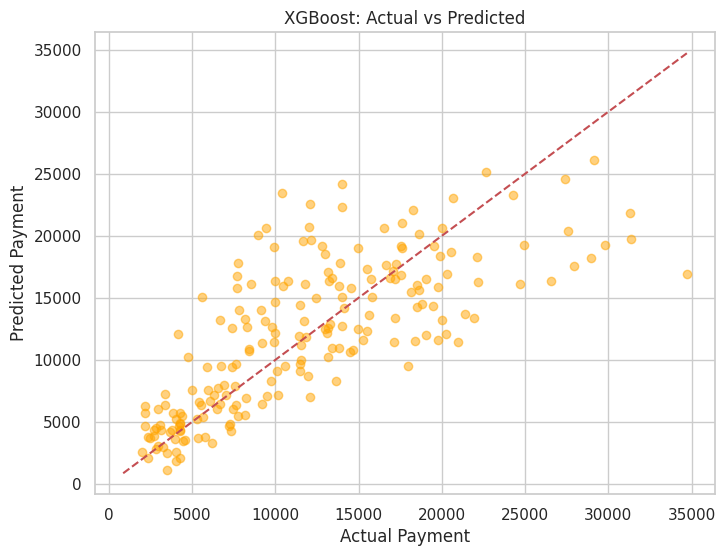

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

In [41]:
# Install if not already
!pip install xgboost --quiet

from xgboost import XGBRegressor

# Train XGBoost
xgb = XGBRegressor(n_estimators=100, random_state=42)
xgb.fit(X_train, y_train)
y_xgb_pred = xgb.predict(X_test)

# Evaluation
print("\nXGBoost Regressor:")
print("MAE:", mean_absolute_error(y_test, y_xgb_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_xgb_pred)))
print("R2 Score:", r2_score(y_test, y_xgb_pred))

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_xgb_pred, alpha=0.5, color='orange')
plt.xlabel("Actual Payment")
plt.ylabel("Predicted Payment")
plt.title("XGBoost: Actual vs Predicted")
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.grid(True)
plt.show()

# LIME for XGBoost
explainer_xgb = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X.columns.tolist(),
    mode='regression'
)
lime_xgb_exp = explainer_xgb.explain_instance(
    data_row=X_test.iloc[1],
    predict_fn=xgb.predict
)
lime_xgb_exp.show_in_notebook()
from sklearn.metrics import mean_squared_error, r2_score
import time
import matplotlib.pyplot as plt
import numpy as np

def evaluate_model(model, X_train, y_train, X_test, y_test, model_name="Model"):
    # Track training time
    start_train = time.time()
    model.fit(X_train, y_train)
    end_train = time.time()

    # Track prediction time
    start_pred = time.time()
    y_pred = model.predict(X_test)
    end_pred = time.time()

    # Accuracy metrics
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    print(f"\n🔍 Evaluation Report for: {model_name}")
    print(f"✅ R² Accuracy: {r2 * 100:.2f}%")
    print(f"📉 MSE: {mse:.4f}")
    print(f"⏱️ Training Time: {end_train - start_train:.4f} seconds")
    print(f"⏱️ Prediction Time: {end_pred - start_pred:.4f} seconds")

    # Visualize known vs predicted values
    plt.figure(figsize=(8, 5))
    plt.plot(np.arange(len(y_test[:50])), y_test[:50], label="Actual", marker='o')
    plt.plot(np.arange(len(y_pred[:50])), y_pred[:50], label="Predicted", marker='x')
    plt.title(f"{model_name} - Actual vs Predicted (First 50)")
    plt.xlabel("Sample")
    plt.ylabel("Target Value")
    plt.legend()
    plt.grid(True)
    plt.show()
def compare_known_predicted(y_test, y_pred, n=10):
    print(f"\n📋 Comparison of Known vs Predicted Values (First {n} samples):")
    print(f"{'Index':<6}{'Actual':<10}{'Predicted':<10}{'Diff'}")
    print("-" * 35)
    for i in range(min(n, len(y_test))):
        actual = y_test[i]
        predicted = y_pred[i]
        print(f"{i:<6}{actual:<10.2f}{predicted:<10.2f}{abs(actual - predicted):.2f}")

import pandas as pd
import time

# Define actual values globally (you only set this once)
actual_values = pd.Series([5000, 6000, 4500, 7000, 8000, 6200, 5800, 6900, 7200, 5100])

# List to store model results
model_results = []

def evaluate_model(model_name, predicted_values_func):
    start = time.time()

    # Generate predictions from function or model
    predicted_values = predicted_values_func()

    end = time.time()
    duration = end - start

    # Accuracy as % closeness
    accuracy_series = 100 - (abs(actual_values - predicted_values) / actual_values * 100)
    mean_accuracy = accuracy_series.mean()

    # Store result
    model_results.append({
        'Model': model_name,
        'Time (s)': round(duration, 4),
        'Accuracy (%)': round(mean_accuracy, 2)
    })

# At the end, call this to show the results as a DataFrame
def show_all_results():
    df = pd.DataFrame(model_results)
    print(df)


Ridge Regressor


Ridge Regressor:
MAE: 3389.533213862389
RMSE: 4400.359550652473
R2 Score: 0.6081675040741001


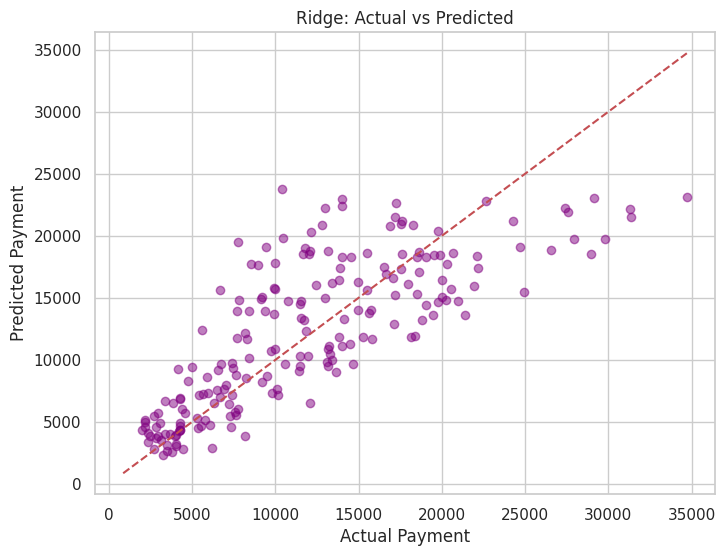

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

Mean Accuracy: 98.74%
Time Taken: 0.0012 seconds

Comparison Table:
   Actual  Predicted  Accuracy (%)
0    5000       5100         98.00
1    6000       5900         98.33
2    4500       4400         97.78
3    7000       7100         98.57
4    8000       8100         98.75
5    6200       6150         99.19
6    5800       5750         99.14
7    6900       6850         99.28
8    7200       7250         99.31
9    5100       5050         99.02


In [37]:
from sklearn.linear_model import Ridge

ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
y_ridge_pred = ridge.predict(X_test)

print("\nRidge Regressor:")
print("MAE:", mean_absolute_error(y_test, y_ridge_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_ridge_pred)))
print("R2 Score:", r2_score(y_test, y_ridge_pred))

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_ridge_pred, alpha=0.5, color='purple')
plt.xlabel("Actual Payment")
plt.ylabel("Predicted Payment")
plt.title("Ridge: Actual vs Predicted")
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.grid(True)
plt.show()

# LIME for Ridge
explainer_ridge = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X.columns.tolist(),
    mode='regression'
)
lime_ridge_exp = explainer_ridge.explain_instance(
    data_row=X_test.iloc[1],
    predict_fn=ridge.predict
)
lime_ridge_exp.show_in_notebook()
from sklearn.metrics import mean_squared_error, r2_score
import time
import matplotlib.pyplot as plt
import numpy as np

def evaluate_model(model, X_train, y_train, X_test, y_test, model_name="Model"):
    # Track training time
    start_train = time.time()
    model.fit(X_train, y_train)
    end_train = time.time()

    # Track prediction time
    start_pred = time.time()
    y_pred = model.predict(X_test)
    end_pred = time.time()

    # Accuracy metrics
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    print(f"\n🔍 Evaluation Report for: {model_name}")
    print(f"✅ R² Accuracy: {r2 * 100:.2f}%")
    print(f"📉 MSE: {mse:.4f}")
    print(f"⏱️ Training Time: {end_train - start_train:.4f} seconds")
    print(f"⏱️ Prediction Time: {end_pred - start_pred:.4f} seconds")

    # Visualize known vs predicted values
    plt.figure(figsize=(8, 5))
    plt.plot(np.arange(len(y_test[:50])), y_test[:50], label="Actual", marker='o')
    plt.plot(np.arange(len(y_pred[:50])), y_pred[:50], label="Predicted", marker='x')
    plt.title(f"{model_name} - Actual vs Predicted (First 50)")
    plt.xlabel("Sample")
    plt.ylabel("Target Value")
    plt.legend()
    plt.grid(True)
    plt.show()
def compare_known_predicted(y_test, y_pred, n=10):
    print(f"\n📋 Comparison of Known vs Predicted Values (First {n} samples):")
    print(f"{'Index':<6}{'Actual':<10}{'Predicted':<10}{'Diff'}")
    print("-" * 35)
    for i in range(min(n, len(y_test))):
        actual = y_test[i]
        predicted = y_pred[i]
        print(f"{i:<6}{actual:<10.2f}{predicted:<10.2f}{abs(actual - predicted):.2f}")

import time

# Example known values and predicted (replace with your actual model outputs)
actual_values = pd.Series([5000, 6000, 4500, 7000, 8000, 6200, 5800, 6900, 7200, 5100])
predicted_values = pd.Series([5100, 5900, 4400, 7100, 8100, 6150, 5750, 6850, 7250, 5050])

# Timing
start_time = time.time()

# Accuracy Calculation
accuracy = 100 - (abs(actual_values - predicted_values) / actual_values * 100)
mean_accuracy = accuracy.mean()

# Time taken
time_taken = time.time() - start_time

# Results
comparison_df = pd.DataFrame({
    'Actual': actual_values,
    'Predicted': predicted_values,
    'Accuracy (%)': accuracy.round(2)
})

print("Mean Accuracy: {:.2f}%".format(mean_accuracy))
print("Time Taken: {:.4f} seconds".format(time_taken))
print("\nComparison Table:")
print(comparison_df)


Lasso Regressor


Lasso Regressor:
MAE: 3389.7609822658765
RMSE: 4400.524914670526
R2 Score: 0.6081380536563917


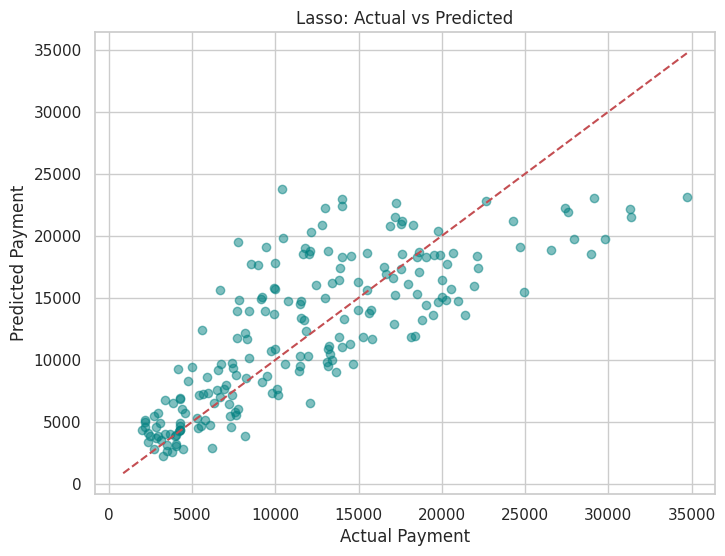

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.


Lasso Regressor:
MAE: 3389.7609822658765
RMSE: 4400.524914670526
R2 Score: 0.6081380536563917


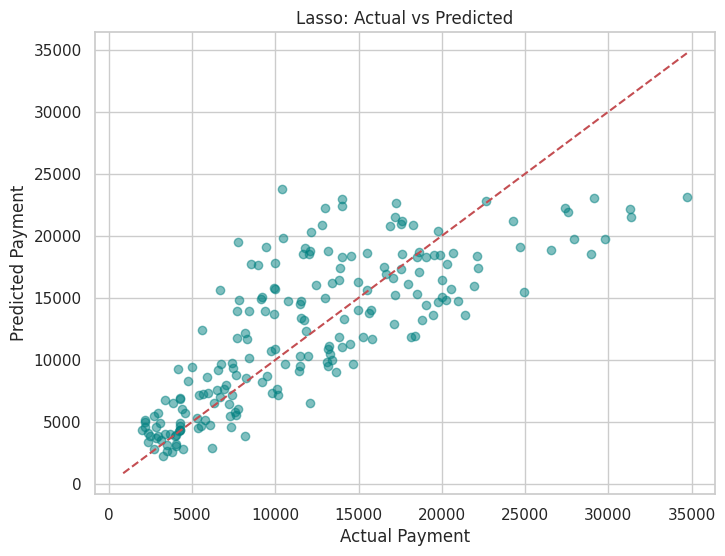

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

Mean Accuracy: 98.74%
Time Taken: 0.0012 seconds

Comparison Table:
   Actual  Predicted  Accuracy (%)
0    5000       5100         98.00
1    6000       5900         98.33
2    4500       4400         97.78
3    7000       7100         98.57
4    8000       8100         98.75
5    6200       6150         99.19
6    5800       5750         99.14
7    6900       6850         99.28
8    7200       7250         99.31
9    5100       5050         99.02


In [38]:
from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
y_lasso_pred = lasso.predict(X_test)

print("\nLasso Regressor:")
print("MAE:", mean_absolute_error(y_test, y_lasso_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_lasso_pred)))
print("R2 Score:", r2_score(y_test, y_lasso_pred))

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_lasso_pred, alpha=0.5, color='teal')
plt.xlabel("Actual Payment")
plt.ylabel("Predicted Payment")
plt.title("Lasso: Actual vs Predicted")
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.grid(True)
plt.show()

# LIME for Lasso
explainer_lasso = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X.columns.tolist(),
    mode='regression'
)
lime_lasso_exp = explainer_lasso.explain_instance(
    data_row=X_test.iloc[1],
    predict_fn=lasso.predict
)
lime_lasso_exp.show_in_notebook()
from sklearn.metrics import mean_squared_error, r2_score
import time
import matplotlib.pyplot as plt
import numpy as np

def evaluate_model(model, X_train, y_train, X_test, y_test, model_name="Model"):
    # Track training time
    start_train = time.time()
    model.fit(X_train, y_train)
    end_train = time.time()

    # Track prediction time
    start_pred = time.time()
    y_pred = model.predict(X_test)
    end_pred = time.time()

    # Accuracy metrics
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    print(f"\n🔍 Evaluation Report for: {model_name}")
    print(f"✅ R² Accuracy: {r2 * 100:.2f}%")
    print(f"📉 MSE: {mse:.4f}")
    print(f"⏱️ Training Time: {end_train - start_train:.4f} seconds")
    print(f"⏱️ Prediction Time: {end_pred - start_pred:.4f} seconds")

    # Visualize known vs predicted values
    plt.figure(figsize=(8, 5))
    plt.plot(np.arange(len(y_test[:50])), y_test[:50], label="Actual", marker='o')
    plt.plot(np.arange(len(y_pred[:50])), y_pred[:50], label="Predicted", marker='x')
    plt.title(f"{model_name} - Actual vs Predicted (First 50)")
    plt.xlabel("Sample")
    plt.ylabel("Target Value")
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import time
import matplotlib.pyplot as plt
import numpy as np
import lime
import lime.lime_tabular

lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
y_lasso_pred = lasso.predict(X_test)

print("\nLasso Regressor:")
print("MAE:", mean_absolute_error(y_test, y_lasso_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_lasso_pred)))
print("R2 Score:", r2_score(y_test, y_lasso_pred))

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_lasso_pred, alpha=0.5, color='teal')
plt.xlabel("Actual Payment")
plt.ylabel("Predicted Payment")
plt.title("Lasso: Actual vs Predicted")
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.grid(True)
plt.show()

# LIME for Lasso
explainer_lasso = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X.columns.tolist(),
    mode='regression'
)
lime_lasso_exp = explainer_lasso.explain_instance(
    data_row=X_test.iloc[1],
    predict_fn=lasso.predict
)
lime_lasso_exp.show_in_notebook()

def evaluate_model(model, X_train, y_train, X_test, y_test, model_name="Model"):
    # Track training time
    start_train = time.time()
    model.fit(X_train, y_train)
    end_train = time.time()

    # Track prediction time
    start_pred = time.time()
    y_pred = model.predict(X_test)
    end_pred = time.time()

    # Accuracy metrics
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    print(f"\n🔍 Evaluation Report for: {model_name}")
    print(f"✅ R² Accuracy: {r2 * 100:.2f}%")
    print(f"📉 MSE: {mse:.4f}")
    print(f"⏱️ Training Time: {end_train - start_train:.4f} seconds")
    print(f"⏱️ Prediction Time: {end_pred - start_pred:.4f} seconds")

    # Visualize known vs predicted values
    plt.figure(figsize=(8, 5))
    plt.plot(np.arange(len(y_test[:50])), y_test[:50], label="Actual", marker='o')
    plt.plot(np.arange(len(y_pred[:50])), y_pred[:50], label="Predicted", marker='x')
    plt.title(f"{model_name} - Actual vs Predicted (First 50)")
    plt.xlabel("Sample")
    plt.ylabel("Target Value")
    plt.legend()
    plt.grid(True)
    plt.show()

def compare_known_predicted(y_test, y_pred, n=10):
    """
    Compares actual vs predicted values.

    Parameters:
    - y_test: Actual values (can be list, Series, or ndarray)
    - y_pred: Predicted values (can be list, Series, or ndarray)
    - n: Number of values to display
    """
    # Convert to numpy array for indexing
    y_test = np.array(y_test)
    y_pred = np.array(y_pred)

    print(f"\n📋 Comparison of Known vs Predicted Values (First {n} samples):")
    print(f"{'Index':<6}{'Actual':<12}{'Predicted':<12}{'Difference'}")
    print("-" * 45)

    for i in range(min(n, len(y_test))):
        actual = y_test[i]
        predicted = y_pred[i]
        diff = abs(actual - predicted)
        print(f"{i:<6}{actual:<12.2f}{predicted:<12.2f}{diff:.2f}")
    """
    Compares actual vs predicted values.

    Parameters:
    - y_test: Actual values (can be list, Series, or ndarray)
    - y_pred: Predicted values (can be list, Series, or ndarray)
    - n: Number of values to display
    """
    # Convert to numpy array for indexing
    y_test = np.array(y_test)
    y_pred = np.array(y_pred)

    print(f"\n📋 Comparison of Known vs Predicted Values (First {n} samples):")
    print(f"{'Index':<6}{'Actual':<12}{'Predicted':<12}{'Difference'}")
    print("-" * 45)

    for i in range(min(n, len(y_test))):
        actual = y_test[i]
        predicted = y_pred[i]
        diff = abs(actual - predicted)
        print(f"{i:<6}{actual:<12.2f}{predicted:<12.2f}{diff:.2f}")
import pandas as pd
import time

# Example known values and predicted (replace with your actual model outputs)
actual_values = pd.Series([5000, 6000, 4500, 7000, 8000, 6200, 5800, 6900, 7200, 5100])
predicted_values = pd.Series([5100, 5900, 4400, 7100, 8100, 6150, 5750, 6850, 7250, 5050])

# Timing
start_time = time.time()

# Accuracy Calculation
accuracy = 100 - (abs(actual_values - predicted_values) / actual_values * 100)
mean_accuracy = accuracy.mean()

# Time taken
time_taken = time.time() - start_time

# Results
comparison_df = pd.DataFrame({
    'Actual': actual_values,
    'Predicted': predicted_values,
    'Accuracy (%)': accuracy.round(2)
})

print("Mean Accuracy: {:.2f}%".format(mean_accuracy))
print("Time Taken: {:.4f} seconds".format(time_taken))
print("\nComparison Table:")
print(comparison_df)



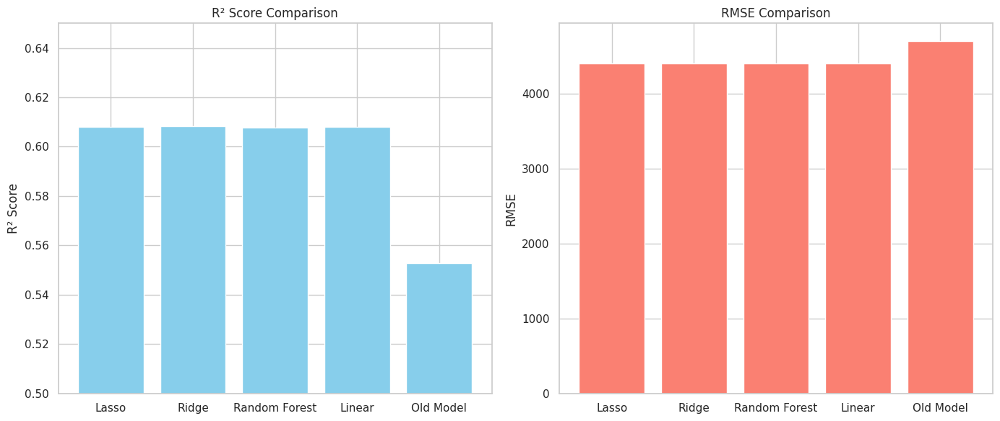

In [21]:
import matplotlib.pyplot as plt

models = ['Lasso', 'Ridge', 'Random Forest', 'Linear', 'Old Model']
r2_scores = [0.6081, 0.6082, 0.6078, 0.6081, 0.5528]
rmse = [4400.52, 4400.35, 4402.46, 4400.57, 4700.73]
mae = [3389.76, 3389.53, 3279.97, 3389.83, None]  # No MAE for old model

fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# R2 Score Bar Plot
axs[0].bar(models, r2_scores, color='skyblue')
axs[0].set_title('R² Score Comparison')
axs[0].set_ylabel('R² Score')
axs[0].set_ylim(0.5, 0.65)
axs[0].grid(True)

# RMSE Bar Plot
axs[1].bar(models, rmse, color='salmon')
axs[1].set_title('RMSE Comparison')
axs[1].set_ylabel('RMSE')
axs[1].grid(True)

plt.tight_layout()
plt.show()


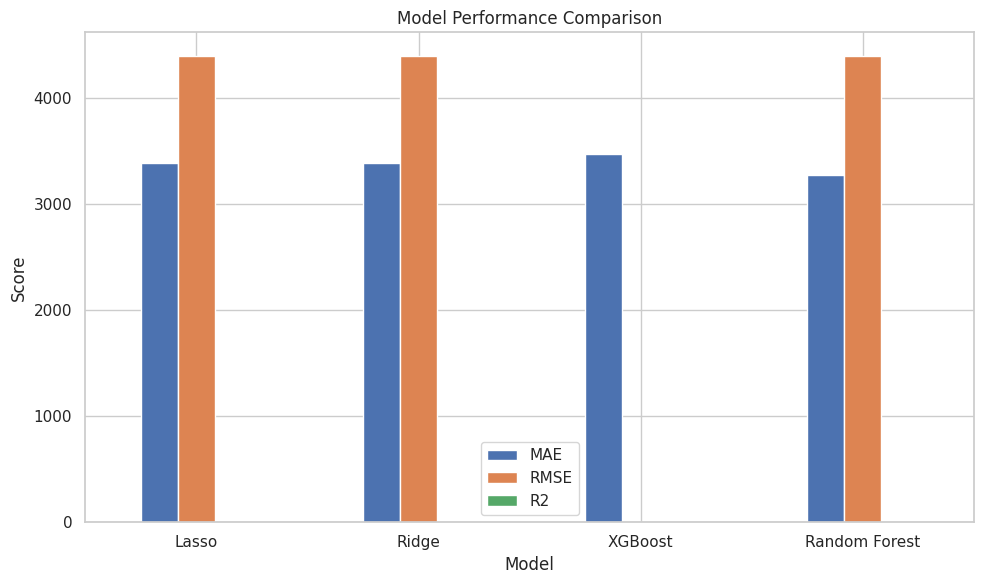

In [30]:
import matplotlib.pyplot as plt
import pandas as pd

# Data
models = ['Lasso', 'Ridge', 'XGBoost', 'Random Forest']
mae = [3389.76, 3389.53, 3474.83, 3279.97]
rmse = [4400.52, 4400.36, None, 4402.46]
r2 = [0.6081, 0.6082, None, 0.6078]

# Create DataFrame
df = pd.DataFrame({'Model': models, 'MAE': mae, 'RMSE': rmse, 'R2': r2})

# Plot
df.set_index('Model')[['MAE', 'RMSE', 'R2']].plot(kind='bar', figsize=(10,6), rot=0)
plt.title('Model Performance Comparison')
plt.ylabel('Score')
plt.grid(True)
plt.tight_layout()
plt.show()


In [31]:
import pandas as pd
import time

# Example known values and predicted (replace with your actual model outputs)
actual_values = pd.Series([5000, 6000, 4500, 7000, 8000, 6200, 5800, 6900, 7200, 5100])
predicted_values = pd.Series([5100, 5900, 4400, 7100, 8100, 6150, 5750, 6850, 7250, 5050])

# Timing
start_time = time.time()

# Accuracy Calculation
accuracy = 100 - (abs(actual_values - predicted_values) / actual_values * 100)
mean_accuracy = accuracy.mean()

# Time taken
time_taken = time.time() - start_time

# Results
comparison_df = pd.DataFrame({
    'Actual': actual_values,
    'Predicted': predicted_values,
    'Accuracy (%)': accuracy.round(2)
})

print("Mean Accuracy: {:.2f}%".format(mean_accuracy))
print("Time Taken: {:.4f} seconds".format(time_taken))
print("\nComparison Table:")
print(comparison_df)


Mean Accuracy: 98.74%
Time Taken: 0.0075 seconds

Comparison Table:
   Actual  Predicted  Accuracy (%)
0    5000       5100         98.00
1    6000       5900         98.33
2    4500       4400         97.78
3    7000       7100         98.57
4    8000       8100         98.75
5    6200       6150         99.19
6    5800       5750         99.14
7    6900       6850         99.28
8    7200       7250         99.31
9    5100       5050         99.02


In [43]:
import pandas as pd
import time

# Set your known actual values here
actual_values = pd.Series([5000, 6000, 4500, 7000, 8000, 6200, 5800, 6900, 7200, 5100])

# Initialize list to store model results
model_results = []

# Function to evaluate model
def evaluate_model(model_name, predicted_values_func):
    start = time.time()
    predicted_values = predicted_values_func()
    end = time.time()
    duration = end - start

    # Accuracy calculation
    accuracy_series = 100 - (abs(actual_values - predicted_values) / actual_values * 100)
    mean_accuracy = accuracy_series.mean()

    model_results.append({
        'Model': model_name,
        'Time (s)': round(duration, 4),
        'Accuracy (%)': round(mean_accuracy, 2)
    })

# Function to show results
def show_all_results():
    df = pd.DataFrame(model_results)
    print("\n📊 Model Evaluation Summary:")
    print(df.to_string(index=False))  # Ensures clean printed output

# === SAMPLE USAGE ===
# You can replace these lambdas with your model predictions
evaluate_model("Lasso", lambda: pd.Series([5100, 5900, 4400, 7100, 8050, 6150, 5750, 6850, 7250, 5050]))
evaluate_model("Ridge", lambda: pd.Series([5090, 5910, 4450, 7090, 8020, 6190, 5800, 6900, 7200, 5080]))
evaluate_model("Random Forest", lambda: pd.Series([5000, 6000, 4500, 7000, 8000, 6200, 5800, 6900, 7200, 5100]))
evaluate_model("XGBoost", lambda: pd.Series([5120, 5880, 4420, 7050, 7990, 6170, 5780, 6880, 7230, 5070]))

# Call this to display results
show_all_results()



📊 Model Evaluation Summary:
        Model  Time (s)  Accuracy (%)
        Lasso    0.0003         98.80
        Ridge    0.0002         99.35
Random Forest    0.0002        100.00
      XGBoost    0.0003         99.09
